In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
def load_image(path):
    img = cv.imread(path)
    scale = 256/max(img.shape)
    img = cv.resize(img, dsize = (int(img.shape[1]*scale),int(img.shape[0]*scale)))
    img = img/127.5 - 1
    return img

In [ ]:
real_img = load_image('style_transfer_img.jpg')
drawing_img = load_image('drawing.jpg')
drawing_target_img = load_image('drawing_target.jpg')

In [ ]:
fig, axs = plt.subplots(nrows = 1, ncols = 3)
axs[0].imshow(drawing_img), axs[0].set_xticks([]), axs[0].set_yticks([])
axs[1].imshow(real_img), axs[1].set_xticks([]), axs[1].set_yticks([])
axs[2].imshow(drawing_target_img), axs[2].set_xticks([]), axs[2].set_yticks([])

In [ ]:
sobelx = cv.Sobel(real_img, cv.CV_64F, 1, 0, ksize = 3)
sobely = cv.Sobel(real_img, cv.CV_64F, 0, 1, ksize = 3)

energy_map = np.abs(sobelx) + np.abs(sobely)

In [ ]:
fig, axs = plt.subplots(nrows = 1 , ncols = 4)
axs[0].imshow(real_img)
axs[1].imshow(sobelx)
axs[2].imshow(sobely)
axs[3].imshow(energy_map)

In [ ]:
def energy_map_sobel(img):
    sobelx = cv.Sobel(img, cv.CV_64F, 1, 0, ksize = 3)
    sobely = cv.Sobel(img, cv.CV_64F, 1, 0, ksize = 3)
    energy_map = np.abs(sobelx) + np.abs(sobely)
    return energy_map

In [ ]:
# cycle_gan_drawing = np.load('C:\\Users\\sw991\\project\\230501_GAN\\image_data\\cycle_gan_drawing.npy')
cycle_gan_img = np.load('image_data/cycle_gan_img.npy')

In [ ]:
original_img = cycle_gan_img[2]
original_img = np.expand_dims(original_img, axis = 0)

In [24]:
original_img = cv.imread('image_data/seoul.jpeg')
original_img = cv.resize(original_img, dsize = (256,256))

In [5]:
original_img.shape

(256, 256, 3)

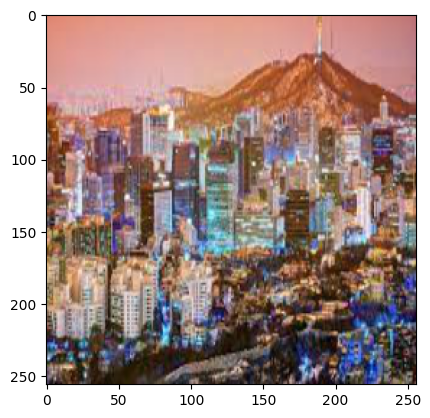

In [7]:
plt.imshow(original_img)

In [26]:
original_img = np.expand_dims(original_img, axis = 0)

In [10]:
from tensorflow import keras
import tensorflow as tf

In [11]:
def generator():
    input_tensor = keras.Input(shape = (256,256,3))
    output = keras.layers.Conv2D(3, kernel_size = 3, strides = 2, padding = 'same')(input_tensor)
     
    model = keras.Model(input_tensor, output)
    return model


In [12]:
gen = generator()

Metal device set to: Apple M1


2023-05-15 15:32:02.611107: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-05-15 15:32:02.611324: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [13]:
def img_gen(img,gen):
    new_img = gen(img)
#     print(new_img.shape)
#     print(type(new_img[0]))
    re_img = tf.image.resize(new_img, (256,256))
    
    plt.imshow(re_img[0])
    return re_img
    
    

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


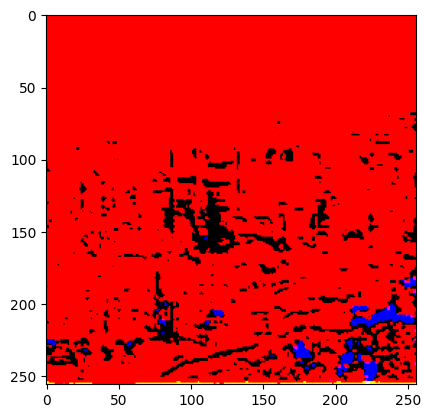

In [14]:
img = img_gen(original_img, gen)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


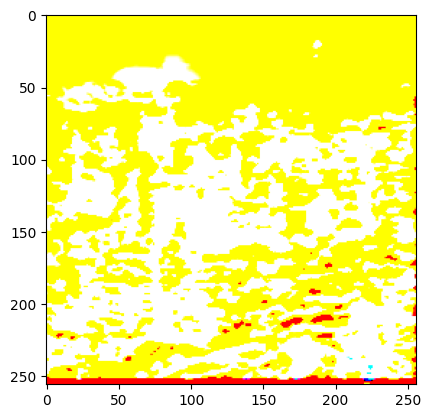

In [15]:
img = img_gen(img, gen)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


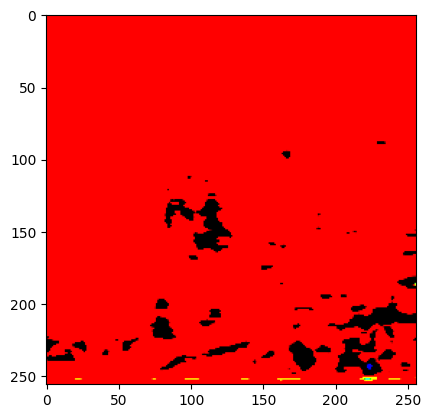

In [16]:
img = img_gen(img, gen)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


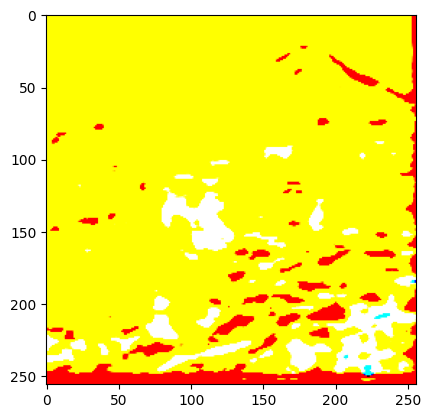

In [17]:
img = img_gen(img, gen)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


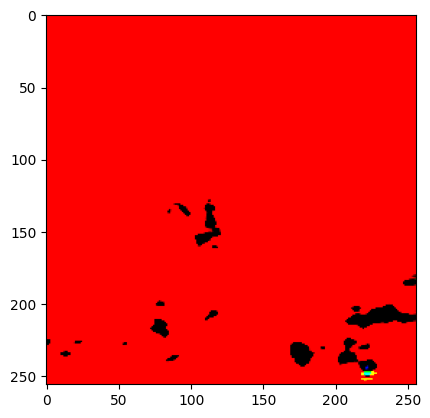

In [18]:
img = img_gen(img, gen)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


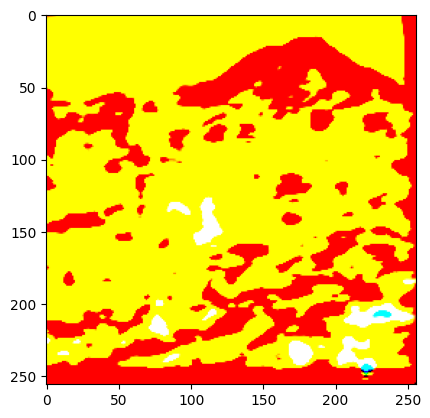

In [19]:
img = img_gen(img, gen)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


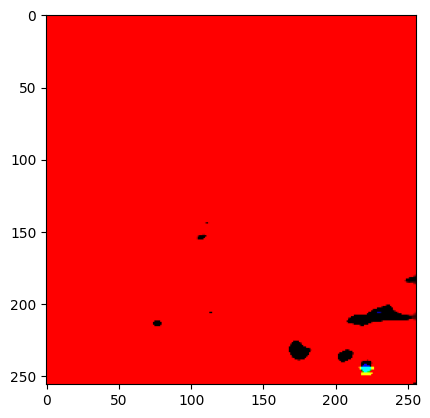

In [20]:
img = img_gen(img, gen)

In [41]:
import tensorflow as tf

original_img = original_img.astype(np.float64)

# Conv2D 레이어 생성
conv1 = tf.keras.layers.Conv2D(filters=16, kernel_size=3, strides=1, padding='same')
conv2 = tf.keras.layers.Conv2D(filters=32, kernel_size=3, strides=1, padding='same')
conv3 = tf.keras.layers.Conv2D(filters=64, kernel_size=3, strides=1, padding='same')
conv4 = tf.keras.layers.Conv2D(filters=128, kernel_size=3, strides=1, padding='same')
conv5 = tf.keras.layers.Conv2D(filters=256, kernel_size=3, strides=1, padding='same')
conv6 = tf.keras.layers.Conv2D(filters=512, kernel_size=3, strides=1, padding='same')


# 입력 이미지를 Conv2D 레이어를 통해 처리하고 중간 이미지 저장
output1 = conv1(original_img)
output2 = conv2(output1)
output3 = conv3(output2)
output4 = conv4(output3)
output5 = conv5(output4)
output6 = conv6(output5)

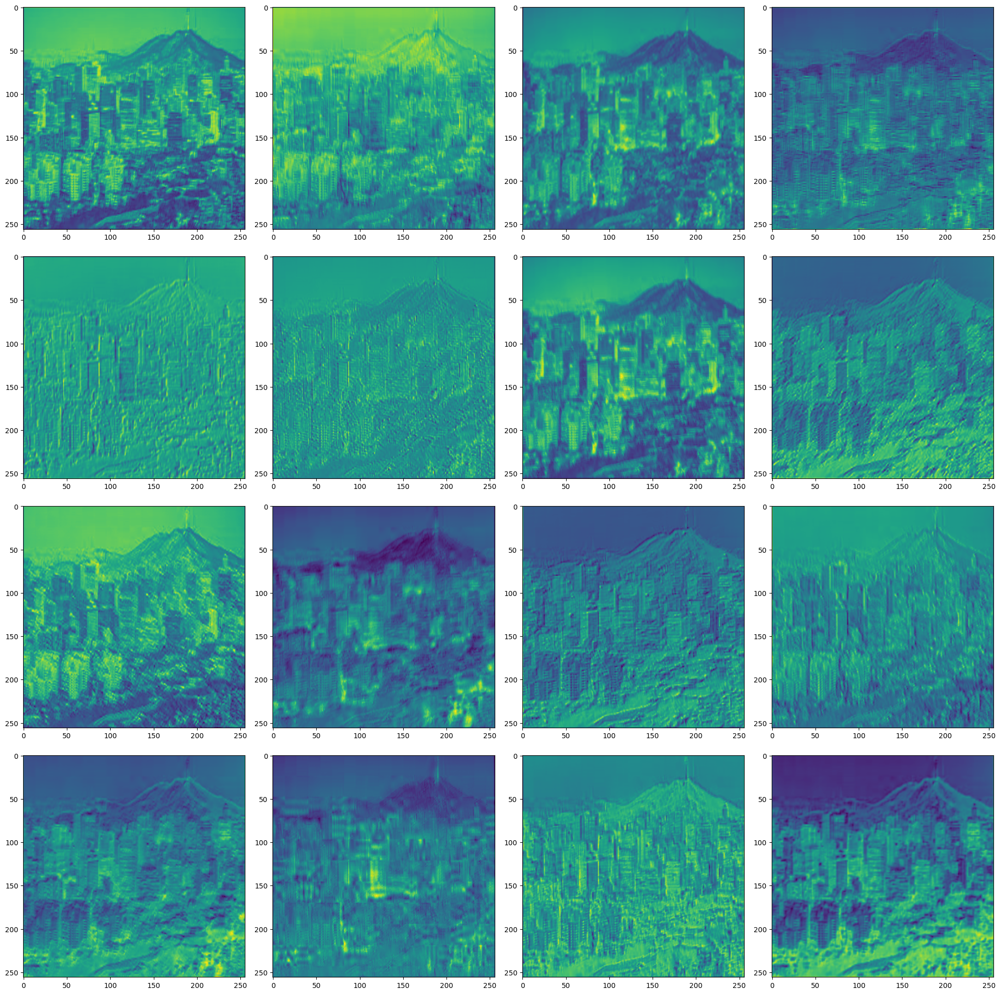

In [39]:
fig, axs = plt.subplots(nrows = 4, ncols = 4, figsize=(20,20))
for i in range(4):
    for j in range(4):
        axs[i][j].imshow(output1[0,:,:,4*i+j])

plt.tight_layout()
plt.show()

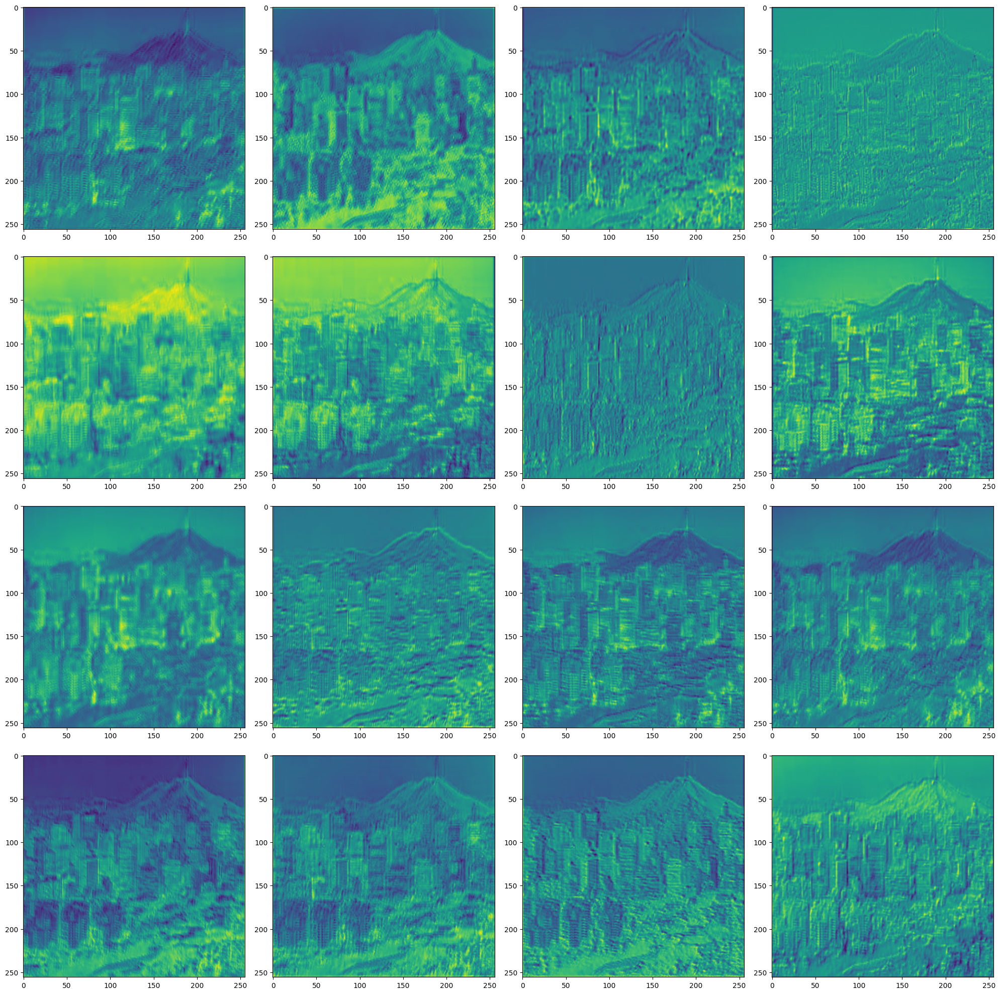

In [40]:
fig, axs = plt.subplots(nrows = 4, ncols = 4, figsize=(20,20))
for i in range(4):
    for j in range(4):
        axs[i][j].imshow(output2[0,:,:,4*i+j])

plt.tight_layout()
plt.show()

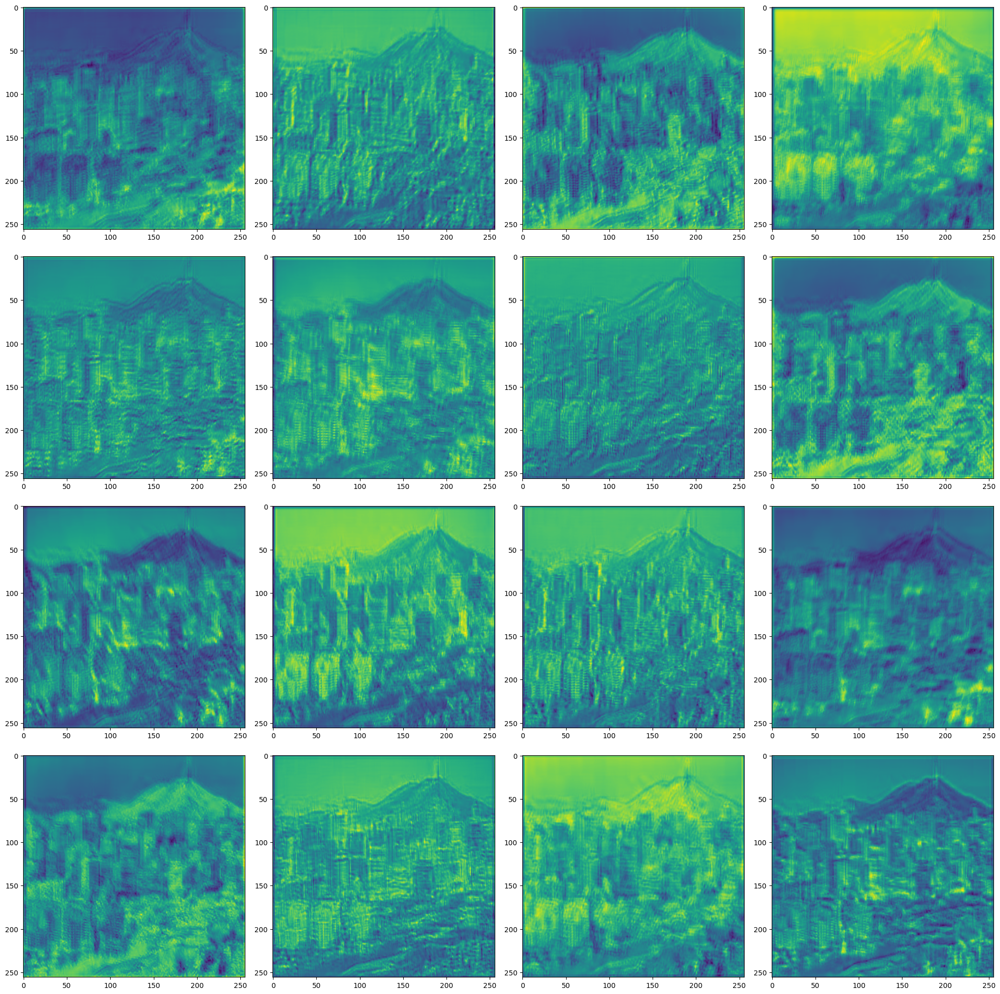

In [42]:
fig, axs = plt.subplots(nrows = 4, ncols = 4, figsize=(20,20))
for i in range(4):
    for j in range(4):
        axs[i][j].imshow(output6[0,:,:,4*i+j])

plt.tight_layout()
plt.show()

In [43]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# CIFAR-10 데이터셋 로드
cifar10 = tf.keras.datasets.cifar10
(_, _), (x_test, _) = cifar10.load_data()
x_test = x_test.astype('float32') / 255.0

# 사전에 학습된 모델 로드
model = tf.keras.models.load_model('path/to/your/pretrained/model.h5')

# 초기 합성곱 레이어의 가중치 가져오기
weights = model.layers[0].get_weights()[0]

# 필터 시각화
fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(10, 10))
for i, ax in enumerate(axs.flat):
    # 필터 가중치 가져오기
    filter_weights = weights[:, :, :, i]
    filter_weights = np.squeeze(filter_weights)

    # 필터 시각화
    ax.imshow(filter_weights, cmap='gray')
    ax.axis('off')

plt.tight_layout()
plt.show()

170498071/170498071 [==============================] - 337s 2us/step


OSError: No file or directory found at path/to/your/pretrained/model.h5